In [1]:
from sklearn.neighbors import KNeighborsClassifier
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

In [2]:
df = pd.read_csv('val_stats.csv', low_memory=False, on_bad_lines='skip')

In [3]:
df.describe()

,damage_round,headshots,headshot_percent,aces,clutches,flawless,first_bloods,kills,deaths,assists,kd_ratio,kills_round,most_kills,score_round,wins,win_percent
count,85671.000000,85671.000000,85671.000000,85671.000000,85671.000000,85671.000000,85671.000000,85671.000000,85671.000000,85671.000000,85671.000000,85671.000000,85671.000000,85671.000000,85671.000000,85671.000000
mean,142.815803,458.312276,23.599211,1.058503,66.333042,39.103232,100.653068,722.752904,691.000945,227.422768,1.827040,0.759336,28.016986,217.380106,24.316957,54.094784
std,16.470962,371.900611,5.187876,1.492352,53.094719,31.058407,90.911647,573.842912,548.570209,179.710227,15.990967,0.099396,5.535530,29.273394,21.790855,11.795850
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,132.800000,185.000000,20.000000,0.000000,27.000000,16.000000,37.000000,296.000000,284.000000,91.000000,0.960000,0.700000,25.000000,201.800000,10.000000,48.100000
50%,142.000000,366.000000,23.300000,1.000000,54.000000,32.000000,75.000000,587.000000,562.000000,185.000000,1.040000,0.800000,28.000000,216.700000,20.000000,52.900000
75%,151.800000,631.000000,26.800000,2.000000,92.000000,55.000000,137.000000,1000.000000,956.000000,319.000000,1.130000,0.800000,31.000000,232.500000,33.000000,59.000000
max,340.600000,5261.000000,83.300000,24.000000,488.000000,316.000000,977.000000,5548.000000,6016.000000,4517.000000,932.000000,2.000000,58.000000,550.500000,294.300000,170.000000


In [4]:
df.head(10)

,region,name,tag,rating,damage_round,headshots,headshot_percent,aces,clutches,flawless,first_bloods,kills,deaths,assists,kd_ratio,kills_round,most_kills,score_round,wins,win_percent
0,NorthAmerica,ShimmyXD,#NorthAmerica1,Radiant,135.8,992,24.9,0,140,80,161,1506,1408,703,1.07,0.7,29.0,208.8,59.0,59.6
1,NorthAmerica,XSET Cryo,#cells,Radiant,170.3,879,28.3,2,122,94,316,1608,1187,206,1.35,1.0,32.0,270.6,52.0,65.8
2,NorthAmerica,PuRelittleone,#yoruW,Radiant,147.5,720,24.0,3,117,59,216,1115,1064,267,1.05,0.8,39.0,227.8,42.0,65.6
3,NorthAmerica,Boba,#0068,Radiant,178.2,856,37.3,3,83,49,235,1134,812,157,1.40,1.0,37.0,277.0,32.0,62.8
4,NorthAmerica,i love miNorthAmerica,#kelly,Radiant,149.8,534,24.4,2,71,38,137,869,781,213,1.11,0.8,29.0,230.9,32.0,62.8
5,NorthAmerica,Decay,#GODK,Radiant,134.1,1038,26.0,2,162,94,179,1542,1492,629,1.03,0.7,33.0,208.1,57.0,58.2
6,NorthAmerica,Osias,#1212,Radiant,163.4,1472,25.2,7,186,92,311,2190,1890,614,1.16,0.9,37.0,249.1,69.0,55.6
7,NorthAmerica,Knights RIKU,#KRN,Radiant,153.3,510,17.5,2,112,64,215,1246,1066,341,1.17,0.8,36.0,237.6,44.0,62.0
8,NorthAmerica,RaijuACE,#3131,Radiant,153.7,1181,24.6,2,189,132,515,2859,2182,440,1.31,0.9,38.0,242.1,88.0,56.8
9,NorthAmerica,dawn,#24k,Radiant,153.6,339,20.8,1,56,44,103,774,564,140,1.37,0.9,29.0,241.0,29.0,69.0


In [5]:
df.dtypes

region               object
name                 object
tag                  object
rating               object
damage_round        float64
headshots             int64
headshot_percent    float64
aces                  int64
clutches              int64
flawless              int64
first_bloods          int64
kills                 int64
deaths                int64
assists               int64
kd_ratio            float64
kills_round         float64
most_kills          float64
score_round         float64
wins                float64
win_percent         float64
dtype: object

In [6]:
df.region.unique()

array(['NorthAmerica', 'EU', 'AP', 'KR', 'BR', 'LAT'], dtype=object)

In [7]:
df.rating.unique()

array(['Radiant', 'Immortal 3', 'Immortal 2', 'Immortal 1', 'Silver 2',
       'Gold 2', 'Diamond 3', 'Gold 1', 'Unrated', 'Platinum 1',
       'Bronze 3', 'Gold 3', 'Bronze 2', 'Diamond 2', 'Silver 3',
       'Silver 1', 'Platinum 2', 'Diamond 1', 'Platinum 3'], dtype=object)

In [8]:
df.region = df.region.map({'NorthAmerica': 0, 'EU': 1, 'AP': 2, 'KR': 3, 'BR': 4, 'LAT': 5})
df.rating = df.rating.map({'Radiant':0, 'Immortal 3':1, 'Immortal 2':2, 'Immortal 1':3, 'Silver 2':4,
       'Gold 2':5, 'Diamond 3':6, 'Gold 1':7, 'Unrated':8, 'Platinum 1':9,
       'Bronze 3':10, 'Gold 3':11, 'Bronze 2':12, 'Diamond 2':13, 'Silver 3':14,
       'Silver 1':15, 'Platinum 2':16, 'Diamond 1':17, 'Platinum 3':18})

In [9]:
df.drop(["name", "tag"], axis=1, inplace=True)

In [10]:
import seaborn as sb

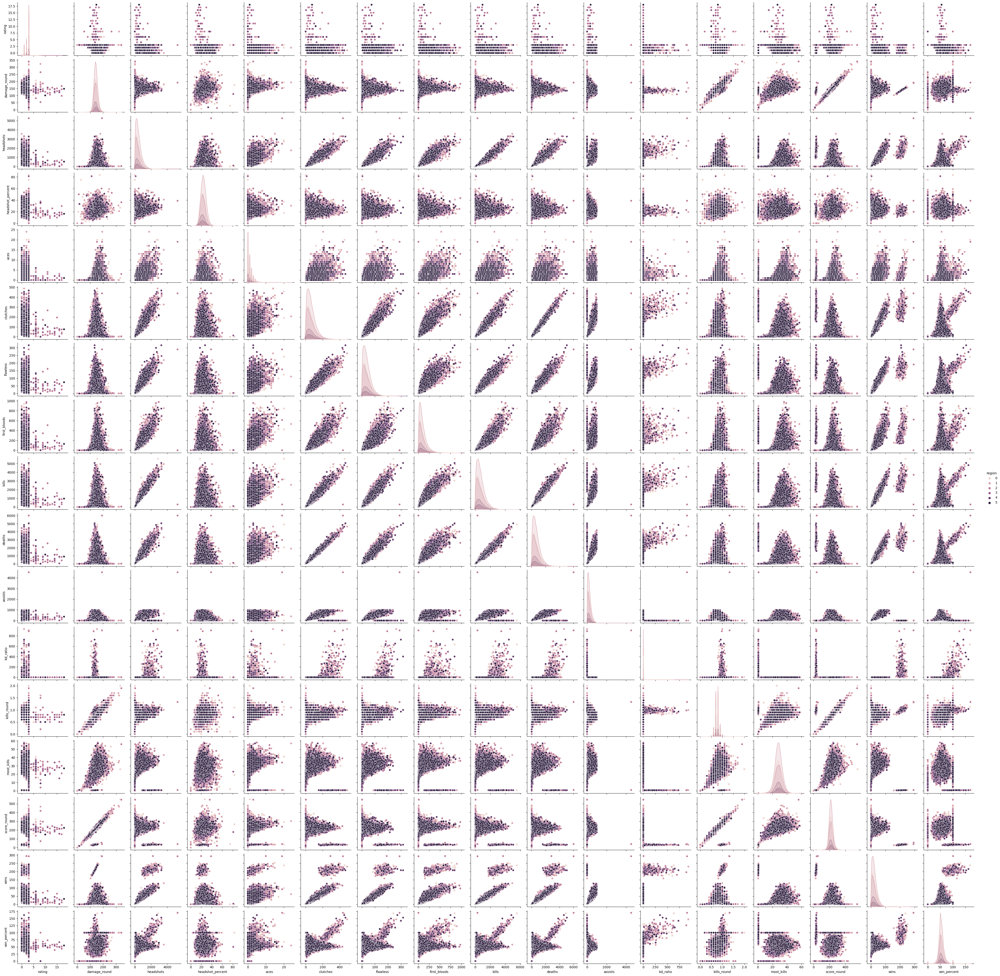

In [11]:
sb.pairplot(df, hue='region')

In [12]:
data_x = df.drop(['region', 'rating' , 'damage_round', 'headshot_percent', 'aces', 'clutches', 'kd_ratio', 'kills_round', 'most_kills', 'score_round', 'win_percent' ], axis='columns')
data_y = df.clutches	

In [13]:
k_nearest = KNeighborsClassifier()
k_nearest.fit(data_x, data_y)

KNeighborsClassifier()

In [14]:
print(f'El score del modelo clasificatorio es: {k_nearest.score(data_x, data_y)}')

El score del modelo clasificatorio es: 0.2918840681210678
